# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> CS109A Introduction to Data Science: 

## Homework 8: Jess Personal Notebook Final Project


**Harvard University**<br/>
**Fall 2019**<br/>
**Instructors**: Pavlos Protopapas, Kevin Rader and Chris Tanner

<hr style="height:2pt">



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import statsmodels as sm
import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [2]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import pandas as pd

In [3]:
cid = '304f47a7973c446fa4cc490eaec6d061'
secret = 'f70927ac3cf14606b2aa54d4217ccf35'

client_credentials_manager = SpotifyClientCredentials(client_id = cid, client_secret = secret)
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)
artist_name, track_name, track_id, popularity = [], [], [], []

In [90]:
songs0 = pd.read_csv("data_million/songs0.csv")
songs1 = pd.read_csv("data_million/songs1.csv")
songs2 = pd.read_csv("data_million/songs2.csv")
songs3 = pd.read_csv("data_million/songs3.csv")
songs4 = pd.read_csv("data_million/songs4.csv")

# no need if already clean
def clean_features(song_csv):
    print(song_csv.shape)
    song_csv['artist_id'] = (song_csv['artist_uri']).str.split("spotify:artist:",1, expand = True).iloc[:,1]
    song_csv['album_id'] = (song_csv['album_uri']).str.split("spotify:album:",1, expand = True).iloc[:,1]
    song_csv['track_id'] = (song_csv['track_uri']).str.split("spotify:track:",1, expand = True).iloc[:,1]
    cleansongs = song_csv[['artist_name','track_name','duration_ms', 'album_name']]
    print(cleansongs)
    return cleansongs

FileNotFoundError: [Errno 2] File b'data_million/songs0.csv' does not exist: b'data_million/songs0.csv'

In [19]:
clean_features(songs0)

(67503, 9)
               artist_name                                    track_name  \
0            Missy Elliott    Lose Control (feat. Ciara & Fat Man Scoop)   
1           Britney Spears                                         Toxic   
2                  Beyoncé                                 Crazy In Love   
3        Justin Timberlake                                Rock Your Body   
4                   Shaggy                                  It Wasn't Me   
5                    Usher                                         Yeah!   
6                    Usher                                        My Boo   
7       The Pussycat Dolls                                       Buttons   
8          Destiny's Child                                   Say My Name   
9                  OutKast                Hey Ya! - Radio Mix / Club Mix   
10           Nelly Furtado                                   Promiscuous   
11         Jesse McCartney  Right Where You Want Me - Radio Edit Version   
1

,artist_name,track_name,duration_ms,album_name
0,Missy Elliott,Lose Control (feat. Ciara & Fat Man Scoop),226863,The Cookbook
1,Britney Spears,Toxic,198800,In The Zone
2,Beyoncé,Crazy In Love,235933,Dangerously In Love (Alben für die Ewigkeit)
3,Justin Timberlake,Rock Your Body,267266,Justified
4,Shaggy,It Wasn't Me,227600,Hot Shot
5,Usher,Yeah!,250373,Confessions
6,Usher,My Boo,223440,Confessions
7,The Pussycat Dolls,Buttons,225560,PCD
8,Destiny's Child,Say My Name,271333,The Writing's On The Wall
9,OutKast,Hey Ya! - Radio Mix / Club Mix,235213,Speakerboxxx/The Love Below


In [20]:
# get artist info
#artist=sp.artist('2wIVse2owClT7go1WT98tk')
# get artist followers
# artist['followers']['total']
# # get artist popularity (highly correlated with followers?)
# artist['popularity']
# art_list = ['followers','popularity']
def get_artist(song_csv):
    big_lists = [[], []]
    count = 0
    for i in range(0, 100, 50):
        artist_id = song_csv['artist_id']
#         artist_features = sp.artist(artist_id[i : i + 50])
#         count = count + 1
#         for artist in artist_features:
#             for i in range(len(art_list)):
#                 if(art_list[i] == 'followers'):
#                     big_lists[i].append(artist[art_list[i]]['total'])
#                 else:
#                     big_lists[i].append(artist[art_list[i]])
#                 print(count)
                
    return artist_id

In [35]:
# test = get_artist(songs0)
artist_track = songs0['artist_id']
artist_track[1:10]
sp.artist(artist_track[1:10])

AttributeError: 'Series' object has no attribute 'split'

In [33]:
test_track = songs0['track_id']
test_track[1:10]
sp.audio_features(test_track[1:10])

[{'danceability': 0.774,
  'energy': 0.838,
  'key': 5,
  'loudness': -3.914,
  'mode': 0,
  'speechiness': 0.114,
  'acousticness': 0.0249,
  'instrumentalness': 0.025,
  'liveness': 0.242,
  'valence': 0.924,
  'tempo': 143.04,
  'type': 'audio_features',
  'id': '6I9VzXrHxO9rA9A5euc8Ak',
  'uri': 'spotify:track:6I9VzXrHxO9rA9A5euc8Ak',
  'track_href': 'https://api.spotify.com/v1/tracks/6I9VzXrHxO9rA9A5euc8Ak',
  'analysis_url': 'https://api.spotify.com/v1/audio-analysis/6I9VzXrHxO9rA9A5euc8Ak',
  'duration_ms': 198800,
  'time_signature': 4},
 {'danceability': 0.664,
  'energy': 0.758,
  'key': 2,
  'loudness': -6.583,
  'mode': 0,
  'speechiness': 0.21,
  'acousticness': 0.00238,
  'instrumentalness': 0,
  'liveness': 0.0598,
  'valence': 0.701,
  'tempo': 99.259,
  'type': 'audio_features',
  'id': '0WqIKmW4BTrj3eJFmnCKMv',
  'uri': 'spotify:track:0WqIKmW4BTrj3eJFmnCKMv',
  'track_href': 'https://api.spotify.com/v1/tracks/0WqIKmW4BTrj3eJFmnCKMv',
  'analysis_url': 'https://api.spo

In [28]:
# # get album info
# (songs0['album_uri']).str.split("spotify:album:",1, expand = True).iloc[:,1]
# album = sp.album('6vV5UrXcfyQD1wu4Qo2I9K')
# # album popularity
# album['popularity']
# album

In [149]:
# track = sp.track('0UaMYEvWZi0ZqiDOoHU3YI')

# songs0['track_id'][1:10]
# len(track['available_markets'])
# track['track_number']
# track['explicit']
# track['popularity']
# track

AttributeError: module 'scipy' has no attribute 'track'

In [84]:
# gets the features for songs, output is a list
features_list = ['acousticness', 'danceability', 'duration_ms' 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']
def get_features(song):
    big_lists = [[], [], [], [], [], [], [], [], [], [], [], []]
    count = 0
    for i in range(0, len(song), 50):
        song_track = song['track_id']
        audio_features = sp.audio_features(song_track[i : i + 50])
        count = count + 1
        for track in audio_features:
            for j in range(len(features_list)):
                big_lists[j].append(track[features_list[j]])
                print(count)
                
    return big_lists

In [168]:
# tracks_list = ['available_markets', 'track_number', 'explicit', 'popularity']
# import time
 
# def get_tracks_more(song_csv):
#     big_lists = []
#     song_track = song_csv['track_id']
#     for i in range(0, len(song_csv), 50):
#         time.sleep(1)
#         for k in range(50):
#             track_indv = sp.track(song_track[k])
#             print(track_indv['popularity'])
#             big_lists.append(track_indv['popularity'])
                    
#     return big_lists

In [89]:
songs0.head()

NameError: name 'songs0' is not defined

In [15]:
# song0list = get_features(songs0)
song1list = get_features(songs1)
# song2list = get_features(songs2)
# song3list = get_features(songs3)
# song4list = get_features(songs4)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8


14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
14
1

20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
2

26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
26
2

32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
32
3

38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
38
3

44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
44
4

50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
5

56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
56
5

62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
62
6

68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
68
6

74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
74
7

80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
8

85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
85
8

91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
91
9

97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
97
9

103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103
103


107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107
107


111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111
111


115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115
115


119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119
119


123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123
123


127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127
127


131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131
131


135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135
135


139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139
139


143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143
143


147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147
147


151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151
151


156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156
156


160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160
160


164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164
164


168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168
168


172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172
172


176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176
176


180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180
180


184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184
184


188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188
188


192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192


196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196
196


200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200
200


204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204
204


208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208
208


212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212
212


216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216
216


221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221
221


225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225


230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230
230


234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234
234


238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238
238


242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242
242


246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246
246


250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250
250


255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255
255


259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259
259


263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263
263


267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267
267


271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271
271


275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275
275


279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279
279


283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283
283


287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287
287


291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291
291


295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295
295


299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299
299


303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303
303


307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307
307


311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311
311


315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315
315


319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319
319


323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323
323


327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327
327


331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331
331


335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335
335


339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339
339


343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343
343


347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347
347


351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351
351


355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355
355


359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359
359


363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363
363


367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367
367


371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371
371


375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375
375


379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379
379


383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383
383


387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387
387


391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391
391


395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395
395


399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399
399


403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403
403


407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407
407


411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411
411


415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415
415


419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419
419


423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423
423


427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427
427


431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431
431


435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435
435


439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439
439


443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443
443


447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447
447


451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451
451


455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455
455


459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459
459


463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463
463


467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467
467


471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471
471


475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475
475


479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479
479


483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483
483


486
486
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487
487


492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492
492


496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496
496


500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500
500


504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504
504


508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508
508


511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
511
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512
512


517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517
517


521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521
521


525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525
525


529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529
529


533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533
533


537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537
537


541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541
541


545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545
545


549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549
549


553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553
553


557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557
557


561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561
561


565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565
565


569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569
569


573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573
573


578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578
578


582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582
582


586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586
586


590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590
590


594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594
594


598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598
598


602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602
602


606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606
606


610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610
610


614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614
614


618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618
618


623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623
623


628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628
628


632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632
632


636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636
636


641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641
641


646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646
646


650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650
650


653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
653
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654
654


659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659
659


664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664
664


669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669
669


673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673
673


677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677
677


681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681
681


685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685
685


689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689
689


693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693
693


696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
696
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697
697


702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702
702


706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706
706


711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711
711


715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715
715


719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719
719


723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723
723


728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728
728


732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732
732


736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736
736


740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740
740


744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744
744


748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748
748


752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752
752


756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756
756


760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760
760


764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764
764


768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768
768


772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772
772


776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776
776


780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780
780


785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785
785


789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789
789


793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793
793


797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797
797


801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801
801


805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805
805


809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809
809


813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813
813


817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817
817


821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821
821


825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825
825


828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
828
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829
829


833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833
833


837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837
837


841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841
841


845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845
845


849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849
849


854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854
854


858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858
858


862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862
862


866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866
866


870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870
870


874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874
874


878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878
878


882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882
882


886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886
886


890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890
890


894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894
894


898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898
898


902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902
902


906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906
906


910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910
910


914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914
914


918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918
918


922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922
922


926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926
926


930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930
930


934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934
934


938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938
938


942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942
942


946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946
946


950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950
950


954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954
954


958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958
958


962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962
962


966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966
966


970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970
970


974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974
974


978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978
978


982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982
982


986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986
986


990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990
990


994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994
994


999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999
999


1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003
1003


1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007
1007


1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011
1011


1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015
1015


1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019
1019


1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023
1023


1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027
1027


1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031
1031


1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035
1035


1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039
1039


1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043
1043


1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046
1046


1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050
1050


1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053
1053


1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1056
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057
1057


1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061
1061


1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065
1065


1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069
1069


1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073
1073


1076
1076
1076
1076
1076
1076
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077
1077


1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080
1080


1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084
1084


1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088
1088


1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092
1092


1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095
1095


1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099
1099


1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103
1103


1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107
1107


1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111
1111


1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115
1115


1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118
1118


1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122
1122


1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126
1126


1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130
1130


1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134
1134


1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138
1138


1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142
1142


1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146
1146


1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150
1150


1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154
1154


1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157
1157


1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161
1161


1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165
1165


1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169
1169


1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173
1173


1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177
1177


1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181
1181


1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185
1185


1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189
1189


1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193
1193


1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197
1197


1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201
1201


1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204
1204


1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208
1208


1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212
1212


1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216
1216


1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220
1220


1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224
1224


1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228
1228


1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232
1232


1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236
1236


1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239
1239


1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242
1242


1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246
1246


1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250
1250


1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254
1254


1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258
1258


1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262
1262


1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266
1266


1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270
1270


1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274
1274


1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278
1278


1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282
1282


1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286
1286


1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290
1290


1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294
1294


1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297
1297


1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301
1301


1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305
1305


1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309
1309


1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313
1313


1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317
1317


1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321
1321


1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325
1325


1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329
1329


1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333
1333


In [18]:
features_list = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']
songfeatures = pd.DataFrame(np.column_stack(song1list), columns=features_list)
songfeatures.head()

,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,0.763,0.451,0.2580,0.00000,2.0,0.136,-15.947,1.0,0.0681,78.620,4.0,0.646
1,0.756,0.588,0.1890,0.00000,0.0,0.169,-17.737,1.0,0.0451,140.467,4.0,0.904
2,0.959,0.281,0.0652,0.00001,6.0,0.102,-22.218,1.0,0.0388,77.442,4.0,0.316
3,0.682,0.746,0.3000,0.00000,8.0,0.390,-16.037,1.0,0.1640,130.248,4.0,0.842
4,0.732,0.493,0.2350,0.00000,7.0,0.126,-14.847,1.0,0.1400,81.589,4.0,0.455


In [30]:
def join_df(clean, features, num):
    songs_total = clean.join(features)
    songs_total.to_csv("complete_data/songs" + str(num) + ".csv", index=False)

In [31]:
join_df(cleansongs1, songfeatures, 1)

In [25]:
cleansongs = song_csv[['artist_name','track_name','duration_ms', 'album_name']]

None


In [9]:
songs0 = pd.read_csv("data/songs2010.csv")
songs1 = pd.read_csv("data/songs2011.csv")
songs2 = pd.read_csv("data/songs2012.csv")
songs3 = pd.read_csv("data/songs2013.csv")
songs4 = pd.read_csv("data/songs2014.csv")
songs5 = pd.read_csv("data/songs2015.csv")
songs6 = pd.read_csv("data/songs2016.csv")
songs7 = pd.read_csv("data/songs2017.csv")
songs8 = pd.read_csv("data/songs2018.csv")
songs9 = pd.read_csv("data/songs2019.csv")

In [10]:
type(songs9)

pandas.core.frame.DataFrame

In [11]:
result = pd.concat([songs0, songs1, songs3, songs4, songs5, songs6, songs7, songs8, songs9])

In [13]:
result.to_csv("data/songs_all_decade.csv", index=False)

Text(0, 0.5, 'Frequency')

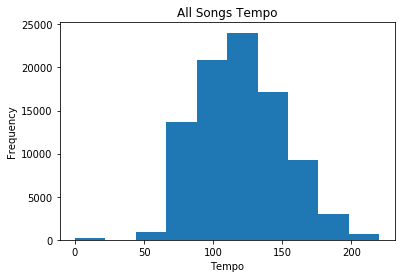

In [16]:
plt.hist(result['Tempo'])
plt.title('All Songs Tempo')
plt.xlabel('Tempo')
plt.ylabel('Frequency')

In [37]:
result = pd.read_csv("data/songs_all_decade.csv")

In [45]:
new_result = result[result['Tempo'] > 0]
new_result = new_result[new_result['Duration_ms'] < 600000]
new_result = new_result[new_result['Speechiness']< 0.66]

Text(0, 0.5, 'Frequency')

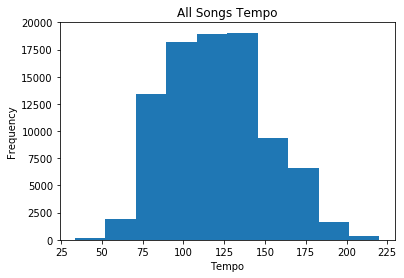

In [20]:
plt.hist(new_result['Tempo'])
plt.title('All Songs Tempo')
plt.xlabel('Tempo')
plt.ylabel('Frequency')
# tempo = 0, white noise example: Baby Sweet Dream Baby White Noise Series - Pure White Noise

Text(0, 0.5, 'Frequency')

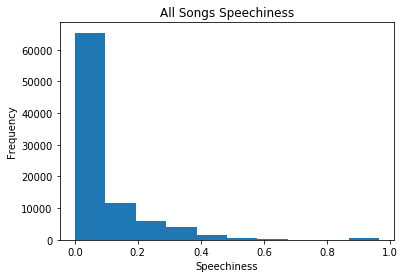

In [48]:
plt.hist(result['Speechiness'])
plt.title('All Songs Speechiness')
plt.xlabel('Speechiness')
plt.ylabel('Frequency')

In [34]:
features_list_cap = ['Acousticness', 'Danceability', 'Duration_ms', 'Energy', 'Instrumentalness', 'Key', 'Liveness', 'Loudness', 'Mode', 'Speechiness', 'Tempo', 'Time Signature', 'Valence', 'Popularity']
def plot_hist(features):
    for f in features:
        plt.hist(new_result[f])
        plt.title('All Songs ' + f)
        plt.xlabel(f)
        plt.ylabel('Frequency')

14

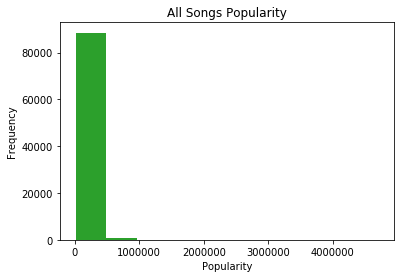

In [36]:
plot_hist(features_list_cap)
len(features_list_cap)

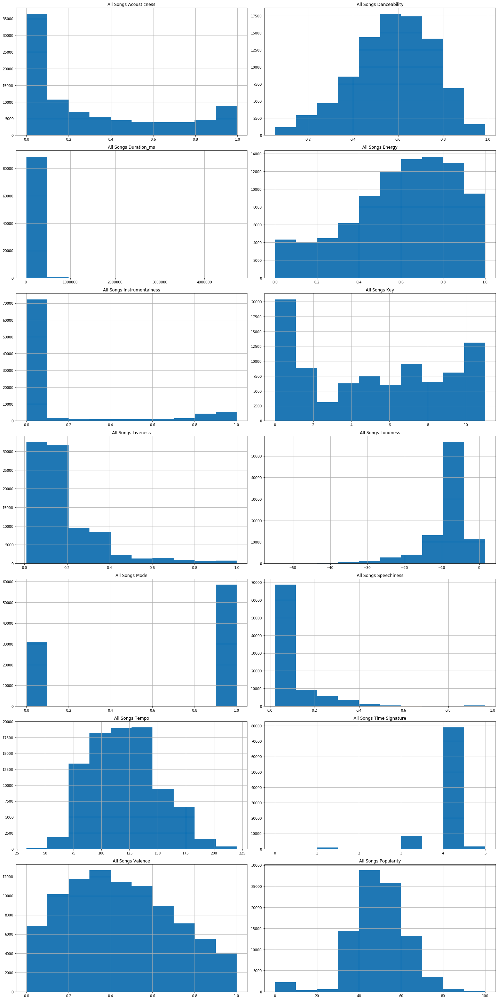

In [55]:
def draw_histograms(df, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(20,40))
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        df[var_name].hist(bins=10,ax=ax)
        ax.set_title('All Songs ' + var_name)
    fig.tight_layout()
    plt.show()

draw_histograms(new_result, features_list_cap, 7, 2)

In [53]:
# songs under 10 minutes, 600000 ms
# Sounds Of Nature Thunderstorm, Rain and Thunderstorm By the Sea (Sounds of Nature: 3x23 Min Long Recordings In 1 Track)
# Wolfgang Amadeus Mozart Piano Concerto No.27 in B flat, K.595: 1. Allegro
above = new_result[new_result['Duration_ms']<600000]
above

,Artist,Track Name,Track ID,Popularity,Acousticness,Danceability,Duration_ms,Energy,Instrumentalness,Key,Liveness,Loudness,Mode,Speechiness,Tempo,Time Signature,Valence
0,John Lennon,Happy Xmas (War Is Over) - Remastered,3zJw3rugfpVrmBeDDnUYzy,85,0.319000,0.328,213880.0,0.607,0.000000,2.0,0.7650,-11.076,1.0,0.0315,146.539,3.0,0.395
1,Bruno Mars,Just the Way You Are,7BqBn9nzAq8spo5e7cZ0dJ,81,0.015100,0.637,220733.0,0.843,0.000000,5.0,0.0876,-5.413,1.0,0.0432,109.012,4.0,0.434
2,Train,"Hey, Soul Sister",4HlFJV71xXKIGcU3kRyttv,83,0.185000,0.673,216773.0,0.886,0.000000,1.0,0.0826,-4.440,0.0,0.0431,97.012,4.0,0.795
3,Waka Flocka Flame,No Hands (feat. Roscoe Dash & Wale),03tqyYWC9Um2ZqU0ZN849H,75,0.005440,0.760,263773.0,0.595,0.000000,1.0,0.2410,-6.366,1.0,0.0391,131.497,4.0,0.361
4,Kanye West,POWER,2gZUPNdnz5Y45eiGxpHGSc,79,0.016200,0.543,292093.0,0.915,0.000000,0.0,0.7440,-4.746,0.0,0.1130,153.998,4.0,0.577
5,Jason Aldean,Dirt Road Anthem,2qYsSHsYkihWx043HVJQRV,73,0.347000,0.680,229400.0,0.741,0.000002,2.0,0.1170,-5.055,1.0,0.0357,127.024,4.0,0.635
6,Eminem,Love The Way You Lie,15JINEqzVMv3SvJTAXAKED,82,0.241000,0.749,263373.0,0.925,0.000000,10.0,0.5200,-5.034,1.0,0.2270,86.989,4.0,0.641
7,Kesha,TiK ToK,0HPD5WQqrq7wPWR7P7Dw1i,80,0.099100,0.755,199693.0,0.837,0.000000,2.0,0.2890,-2.718,0.0,0.1420,120.028,4.0,0.714
8,Miguel,Sure Thing,0JXXNGljqupsJaZsgSbMZV,75,0.027500,0.684,195373.0,0.603,0.000311,11.0,0.1910,-8.127,0.0,0.0989,81.000,4.0,0.504
9,Bruno Mars,Grenade,2tJulUYLDKOg9XrtVkMgcJ,75,0.146000,0.706,223253.0,0.558,0.000000,2.0,0.1180,-7.237,0.0,0.0593,110.443,4.0,0.227


In [56]:
# Aziz Ansari Sheets (comedy skit)
speechiness = above[above['Speechiness']<0.66]

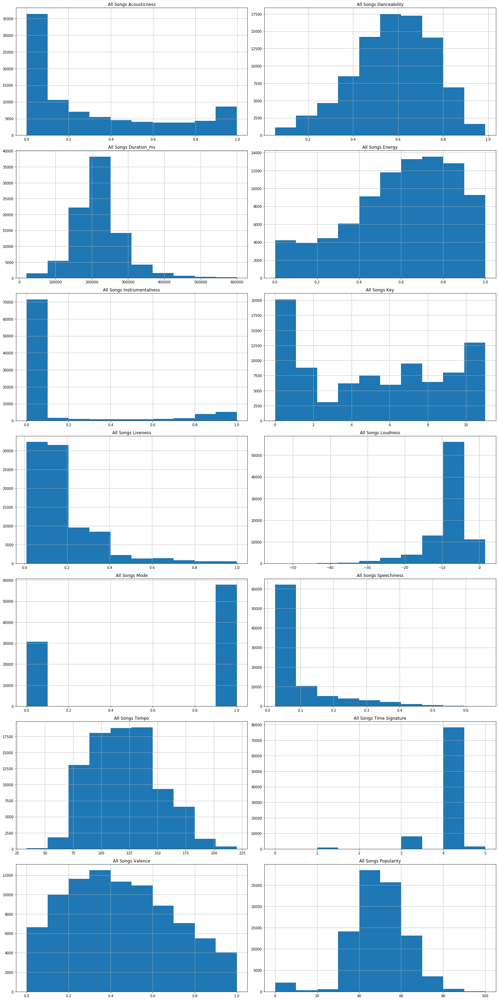

In [61]:
speechiness
# histograms of the new data
draw_histograms(speechiness, features_list_cap, 7, 2)

In [62]:
speechiness.to_csv("data/songs_all_decade_clean.csv", index=False)

In [54]:
# Maroon 5 Happy Christmas (War Is Over), and other christmas songs under
pop = speechiness[speechiness['Popularity']<0.1]
pop

,Artist,Track Name,Track ID,Popularity,Acousticness,Danceability,Duration_ms,Energy,Instrumentalness,Key,Liveness,Loudness,Mode,Speechiness,Tempo,Time Signature,Valence
80674,Camila Cabello,Some Loves Are Forever,0uAjwYVcKyzgcIIgZkYVC5,0,0.838,0.732,27903.0,0.2120,0.0,8.0,0.143,-17.620,0.0,0.939,97.801,3.0,0.914
80675,Camila Cabello,Facing the Truth,38F12BSTGUi6TRgMDdS1pU,0,0.778,0.790,17184.0,0.2560,0.0,6.0,0.134,-15.298,1.0,0.932,82.364,4.0,0.964
80677,Camila Cabello,A Taste of Heaven,3vdVmLjZ4aBjyLAxmdCdAp,0,0.799,0.729,21063.0,0.0611,0.0,5.0,0.115,-22.151,1.0,0.936,45.520,3.0,0.775
80678,Camila Cabello,Love Can Be Easy,4FqAq8SIp2Xi1lQ9a8c1QV,0,0.868,0.810,25442.0,0.1810,0.0,5.0,0.195,-18.581,1.0,0.890,94.639,1.0,0.746
80828,Roddy Ricch,Elyse's Skit,7y6xHDylozEzDBIHpcRBn4,0,0.965,0.803,23883.0,0.2420,0.0,9.0,0.628,-16.513,0.0,0.925,53.297,5.0,0.956


In [4]:
useme = pd.read_csv("data/songs_all_decade_clean.csv")

In [7]:
useme.describe()

,Popularity,Acousticness,Danceability,Duration_ms,Energy,Instrumentalness,Key,Liveness,Loudness,Mode,Speechiness,Tempo,Time Signature,Valence
count,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000,88554.000000
mean,49.006708,0.311873,0.577886,220548.322538,0.600973,0.135175,5.203255,0.189423,-8.324528,0.652991,0.095061,120.630076,3.896662,0.449532
std,13.237356,0.330381,0.176493,68945.507097,0.249771,0.297049,3.589677,0.156954,5.528754,0.476021,0.098324,30.252905,0.431127,0.249264
min,0.000000,0.000000,0.053200,20139.000000,0.000020,0.000000,0.000000,0.009360,-54.837000,0.000000,0.022400,33.506000,0.000000,0.000000
25%,41.000000,0.026600,0.465000,182866.250000,0.444000,0.000000,2.000000,0.097600,-9.510000,0.000000,0.036400,96.032000,4.000000,0.247000
50%,49.000000,0.170000,0.590000,214293.000000,0.638000,0.000010,5.000000,0.124000,-6.737000,1.000000,0.051300,120.014000,4.000000,0.429000
75%,57.000000,0.557000,0.709000,249997.750000,0.800000,0.011300,8.000000,0.231000,-4.987000,1.000000,0.105000,140.052000,4.000000,0.637000
max,100.000000,0.996000,0.987000,599746.000000,1.000000,1.000000,11.000000,0.998000,1.593000,1.000000,0.659000,220.169000,5.000000,1.000000


In [65]:
import random
useme
random.seed(112358)

In [66]:
pop_median = useme.median()[0]
useme['top_hit'] = (useme['Popularity'] > pop_median) * 1

In [67]:
X_train, X_test, y_train, y_test = train_test_split(useme.loc[:, useme.columns != 'top_hit'], 
                                                    useme.top_hit, test_size = 0.2, 
                                                    random_state = 100, 
                                                    stratify = useme.top_hit)

In [68]:
X_train = X_train.drop(columns=['Popularity'])
X_test = X_test.drop(columns=['Popularity'])

In [69]:
X_train_features = X_train.iloc[:, 3:17].head()
X_test_features = X_test.iloc[:, 3:17].head()

In [70]:
features = X_train_features.columns.to_list()

scaler = MinMaxScaler().fit(X_train_features)
X_train_scaled = pd.DataFrame(scaler.transform(X_train_features), columns = features)
X_test_scaled = pd.DataFrame(scaler.transform(X_test_features), columns = features)

In [93]:
# after splitting into train and test and scaling the data
pca_decomposition = PCA().fit(X_train_scaled)
x_train_pca = pca_decomposition.transform(X_train_scaled)
x_test_pca =  pca_decomposition.transform(X_test_scaled)

print(x_train_pca.shape)
print(x_test_pca.shape)

(5, 5)
(5, 5)


In [72]:
variance_explained = pca_decomposition.explained_variance_ratio_
print('Variance explained by each PCA component:', variance_explained[0:2])
print('Total variance explained:', np.sum(variance_explained[0:2]))

Variance explained by each PCA component: [0.40092956 0.3332415 ]
Total variance explained: 0.7341710558416521


In [73]:
count = 0
cumsum = []
for i in range(len(variance_explained)):
    if(np.sum(variance_explained[0:i]) < .90):
        count += 1
        cumsum.append(np.sum(variance_explained[0:i]))

print('Number of PCA components needed to explain 90% of the variability in the predictors:', count)

Number of PCA components needed to explain 90% of the variability in the predictors: 3


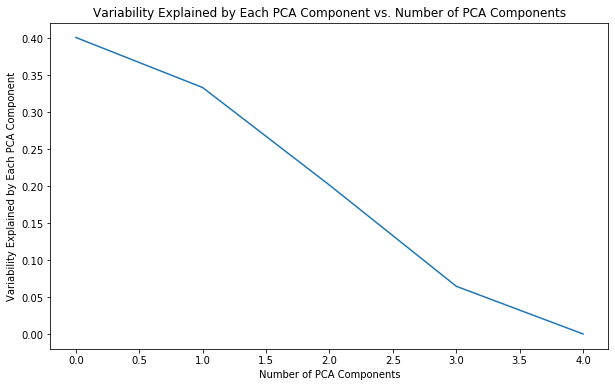

In [74]:
fig, ax = plt.subplots(1, 1, figsize = (10, 6))

x_range = list(range(len(variance_explained)))

plt.plot(x_range, variance_explained)
plt.title('Variability Explained by Each PCA Component vs. Number of PCA Components')
plt.ylabel('Variability Explained by Each PCA Component')
plt.xlabel('Number of PCA Components')
plt.show()

In [92]:
x_train_pca

array([[-1.44559996e-01,  3.99959318e-01, -1.17177458e-01,
         5.91393770e-01, -3.07304152e-17],
       [-3.21519565e-01, -1.02796265e+00, -7.06015498e-01,
        -8.71138549e-02,  2.73927110e-15],
       [ 1.50307919e+00, -1.27146622e-01,  2.25993828e-01,
        -7.41151219e-02, -1.59541703e-15],
       [-2.98291684e-01,  1.08137407e+00, -3.23484532e-01,
        -3.38048783e-01,  6.57602927e-16],
       [-7.38707947e-01, -3.26224115e-01,  9.20683659e-01,
        -9.21160102e-02, -1.26012990e-15]])

In [96]:
x_train_pca[y_train == 1]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 5 but corresponding boolean dimension is 70843

In [94]:
colors = ['r', 'b']
labels = ['Top Hit', 'Not Top Hit']

# iterate over groups and color points
for top_hit in [0, 1]:
    loop_df = x_train_pca[y_train == top_hit]
    plt.scatter(loop_df[:, 0], loop_df[:, 1], c = colors[top_hit], alpha = 0.5, label = labels[top_hit])

plt.xlabel('PCA Dimension 1: Top Hit')
plt.ylabel('PCA Dimention 2: Not Top Hit')
plt.legend()
plt.show()

IndexError: boolean index did not match indexed array along dimension 0; dimension is 5 but corresponding boolean dimension is 70843

In [82]:
def get_playlist_tracks(username,playlist_id):
    results = sp.user_playlist_tracks(username,playlist_id)
    tracks = results['items']
    while results['next']:
        results = sp.next(results)
        tracks.extend(results['items'])
    return tracks

In [85]:
# spotify get new music friday
# spotify:playlist:37i9dQZF1DX873GaRGUmPl
newmusicfriday = get_playlist_tracks('spotify', '37i9dQZF1DX4JAvHpjipBk')

In [86]:
new_music_list = get_features(newmusicfriday)

TypeError: list indices must be integers or slices, not str

In [88]:
newmusicfriday[0]


{'added_at': '2019-12-06T05:01:00Z',
 'added_by': {'external_urls': {'spotify': 'https://open.spotify.com/user/'},
  'href': 'https://api.spotify.com/v1/users/',
  'id': '',
  'type': 'user',
  'uri': 'spotify:user:'},
 'is_local': False,
 'primary_color': None,
 'track': {'album': {'album_type': 'album',
   'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/4nDoRrQiYLoBzwC5BhVJzF'},
     'href': 'https://api.spotify.com/v1/artists/4nDoRrQiYLoBzwC5BhVJzF',
     'id': '4nDoRrQiYLoBzwC5BhVJzF',
     'name': 'Camila Cabello',
     'type': 'artist',
     'uri': 'spotify:artist:4nDoRrQiYLoBzwC5BhVJzF'}],
   'available_markets': ['AD',
    'AE',
    'AR',
    'AT',
    'AU',
    'BE',
    'BG',
    'BH',
    'BO',
    'BR',
    'CA',
    'CH',
    'CL',
    'CO',
    'CR',
    'CY',
    'CZ',
    'DE',
    'DK',
    'DO',
    'DZ',
    'EC',
    'EE',
    'EG',
    'ES',
    'FI',
    'FR',
    'GB',
    'GR',
    'GT',
    'HK',
    'HN',
    'HU',
    'ID',
    'IE'